<a href="https://colab.research.google.com/github/pedro162/machine_learn/blob/main/computer_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import cv2 #OpenCV

##Face detection

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
image = cv2.imread('/content/drive/MyDrive/arquivos_curos_visao_computacional/drive-download-20230813T171824Z-001/Images/people1.jpg')

In [6]:
from google.colab.patches import cv2_imshow

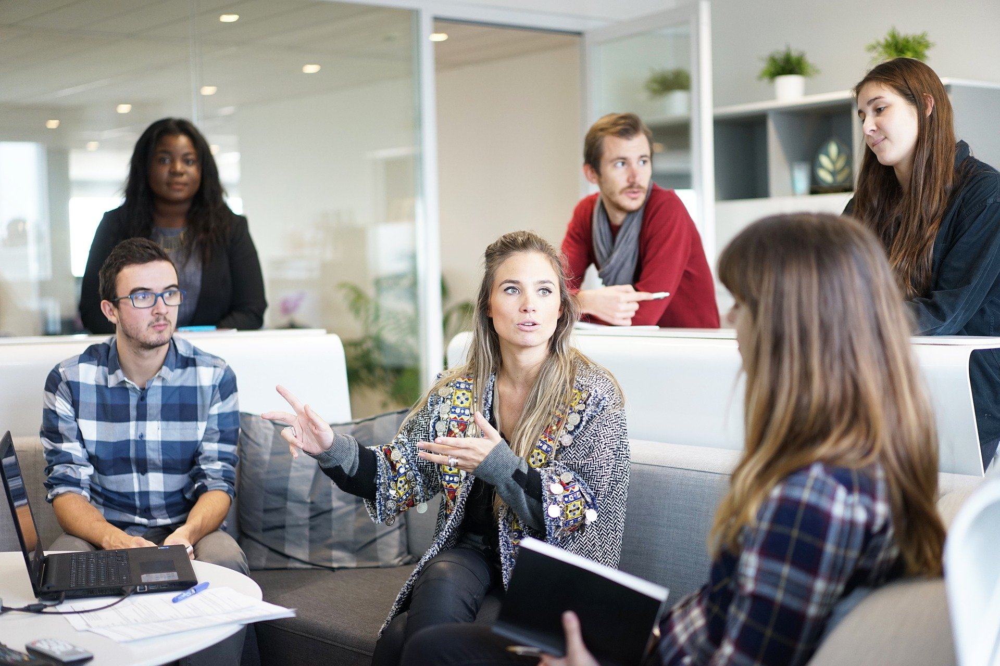

In [7]:
cv2_imshow(image)

In [8]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/arquivos_curos_visao_computacional/drive-download-20230813T171824Z-001/Cascades/haarcascade_frontalface_default.xml')

In [9]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

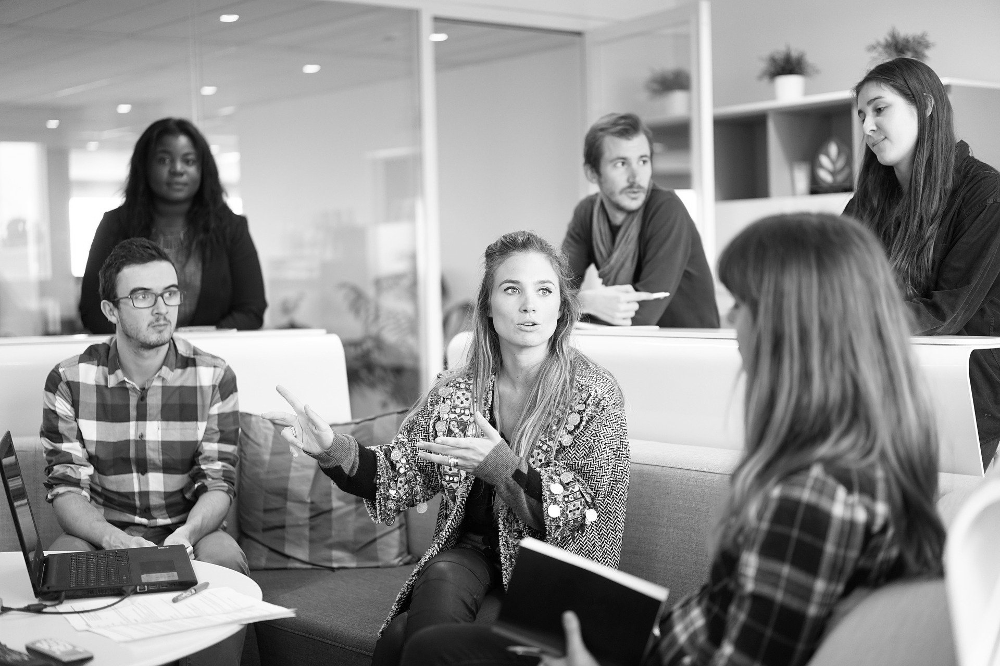

In [10]:
cv2_imshow(gray_image)

In [11]:
detections = face_detector.detectMultiScale(gray_image, scaleFactor=1.4, minSize=(30,30), minNeighbors=1)

In [12]:
detections

array([[ 296,  272,   92,   92],
       [1647,  164,  129,  129],
       [1615,  143,  181,  181],
       [ 274,  254,  129,  129],
       [1147,  262,  129,  129],
       [ 922,  487,  181,  181],
       [ 239,  513,  129,  129],
       [ 953,  705,   92,   92],
       [  99,  778,   66,   66],
       [ 680, 1043,  129,  129]], dtype=int32)

In [13]:
len(detections)

10

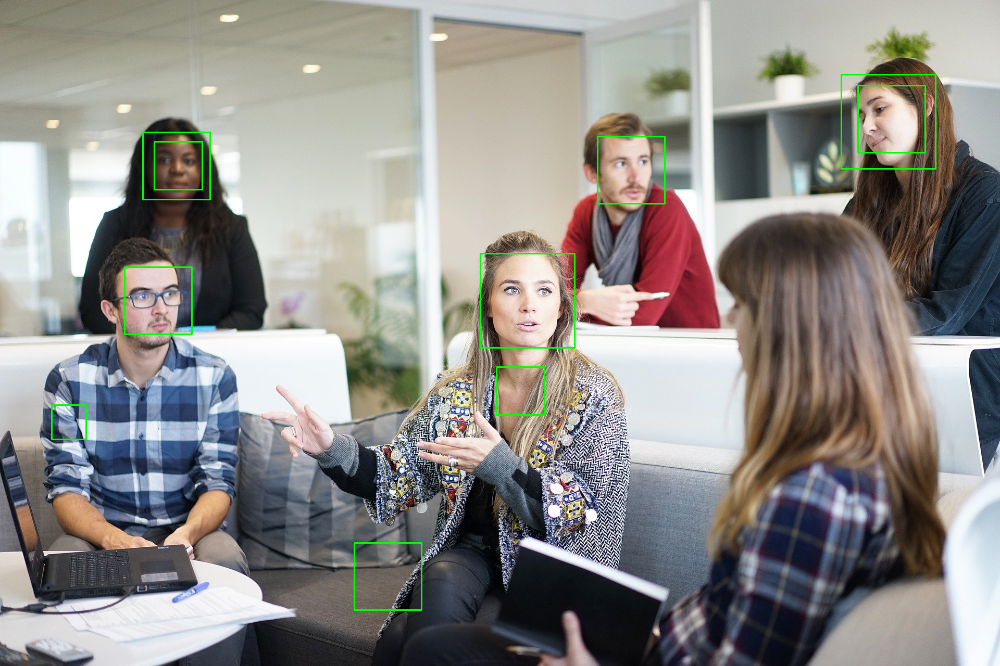

In [14]:
for (x, y, l, a) in detections:
  cv2.rectangle(image, (x,y), (x + l, y + a), (0,255,0), 2)

cv2_imshow(image)

In [15]:
image = "/content/drive/MyDrive/arquivos_curos_visao_computacional/drive-download-20230813T171824Z-001/Images/people3.jpg"

In [16]:
image = cv2.imread(image)

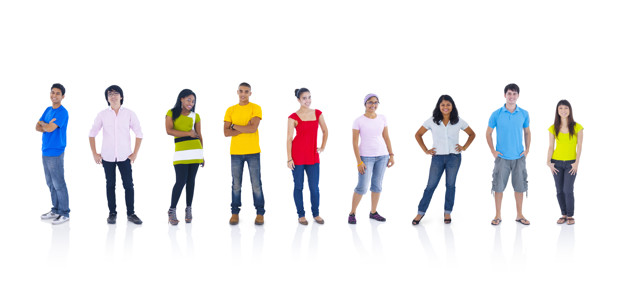

In [17]:
cv2_imshow(image)

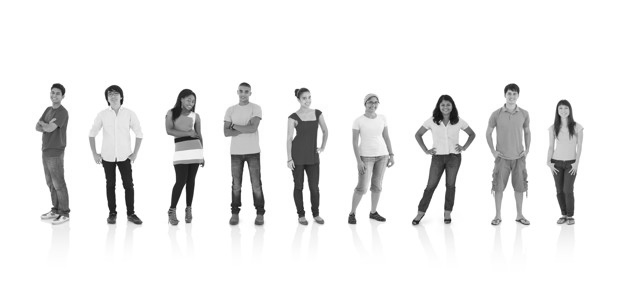

In [18]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

In [19]:
body_detector = cv2.CascadeClassifier("/content/drive/MyDrive/arquivos_curos_visao_computacional/drive-download-20230813T171824Z-001/Cascades/fullbody.xml")

In [20]:
detections = body_detector.detectMultiScale(gray_image, scaleFactor=1.1, minSize=(50,50))

In [21]:
len(detections)

8

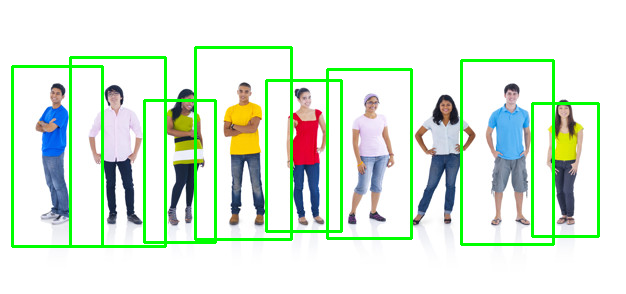

In [22]:
for (x, y, l, a) in detections:
  cv2.rectangle(image, (x,y), (x + l, y + a), (0,255,0), 2)

cv2_imshow(image)

In [23]:
from PIL import Image
import numpy as np

In [24]:
import os

In [25]:
os.listdir("/content/drive/MyDrive/yalefaces/train")

['subject01.glasses.gif',
 'subject01.noglasses.gif',
 'subject01.leftlight.gif',
 'subject01.normal.gif',
 'subject01.rightlight.gif',
 'subject01.sad.gif',
 'subject01.surprised.gif',
 'subject01.sleepy.gif',
 'subject01.wink.gif',
 'subject02.glasses.gif',
 'subject02.happy.gif',
 'subject02.noglasses.gif',
 'subject02.normal.gif',
 'subject02.rightlight.gif',
 'subject02.sleepy.gif',
 'subject02.sad.gif',
 'subject02.surprised.gif',
 'subject02.wink.gif',
 'subject03.centerlight.gif',
 'subject03.happy.gif',
 'subject03.normal.gif',
 'subject03.noglasses.gif',
 'subject03.rightlight.gif',
 'subject03.sleepy.gif',
 'subject03.sad.gif',
 'subject03.wink.gif',
 'subject03.surprised.gif',
 'subject04.centerlight.gif',
 'subject04.happy.gif',
 'subject04.glasses.gif',
 'subject04.noglasses.gif',
 'subject04.normal.gif',
 'subject04.rightlight.gif',
 'subject04.sleepy.gif',
 'subject04.wink.gif',
 'subject05.centerlight.gif',
 'subject05.glasses.gif',
 'subject05.happy.gif',
 'subject05.

In [26]:
def image_data():
  paths = [os.path.join("/content/drive/MyDrive/yalefaces/train", f) for f in os.listdir("/content/drive/MyDrive/yalefaces/train")]
  faces = []
  ids = []
  for path in paths:
    img = Image.open(path).convert('L')
    image_np = np.array(img, 'uint8')
    id = int(os.path.split(path)[1].split(".")[0].replace("subject", ""))
    ids.append(id)
    faces.append(image_np)
  return np.array(ids), faces

In [27]:
ids, faces = image_data()

In [28]:
print(ids)

[ 1  1  1  1  1  1  1  1  1  2  2  2  2  2  2  2  2  2  3  3  3  3  3  3
  3  3  3  4  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5  6  5  6  6  6
  6  6  6  6  6  7  7  7  7  7  7  7  7  7  8  8  8  8  8  8  8  8  8  9
  9  9  9  9  9  9  9  9 10 10 10 10 10 10 10 10 10 11 11 11 11 11 11 11
 11 11 12 12 12 12 12 12 12 12 12 13 13 13 13 13 13 13 13 14 13 14 14 14
 14 14 14 14 14 15 15 15 15 15 15 15 15 15  4]


In [29]:
print(faces[0])

[[130 130 130 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 252 255 255]
 [255 255 255 ... 255 255 255]
 [ 68  68  68 ...  68  68  68]]


In [30]:
lbph = cv2.face.LBPHFaceRecognizer_create()
lbph.train(faces, ids)
lbph.write('/content/drive/MyDrive/LBPHclassifier.yml')

In [31]:
recognizer = cv2.face.LBPHFaceRecognizer_create()
recognizer.read('/content/drive/MyDrive/LBPHclassifier.yml')

In [32]:
test_image = "/content/drive/MyDrive/yalefaces/test/subject10.sad.gif"

In [33]:
image = Image.open(test_image).convert('L')
image_np = np.array(image, 'uint8')
print(image_np)

[[130 130 130 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 241 255 255]
 [255 255 255 ... 234 237 252]
 [ 68  68  68 ...  68  68  68]]


In [34]:
predict_id, _ = recognizer.predict(image_np)
predict_id

10

In [35]:
correct_id = int(os.path.split(test_image)[1].split(".")[0].replace("subject", ""))

In [36]:
correct_id

10

array([[130, 130, 130, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 241, 255, 255],
       [255, 255, 255, ..., 234, 237, 252],
       [ 68,  68,  68, ...,  68,  68,  68]], dtype=uint8)
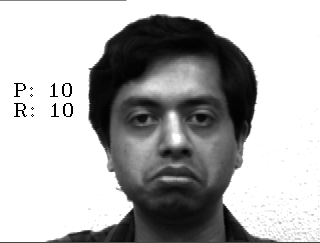

In [37]:
cv2.putText(image_np, 'P: '+str(predict_id), (x,y + 30), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255,0))
cv2.putText(image_np, 'R: '+str(predict_id), (x,y + 50), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255,0))

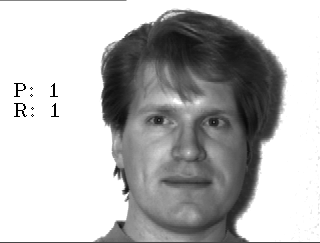

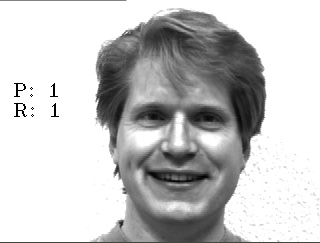

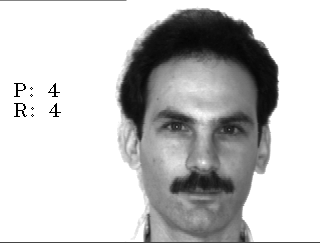

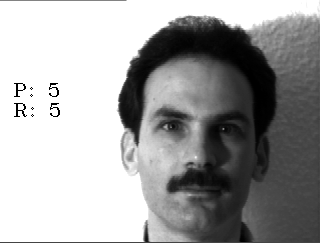

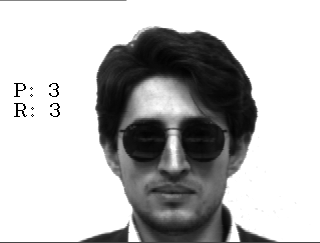

...

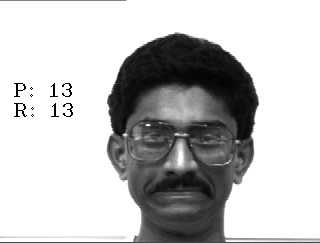

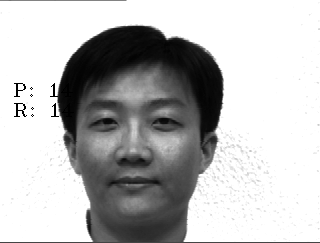

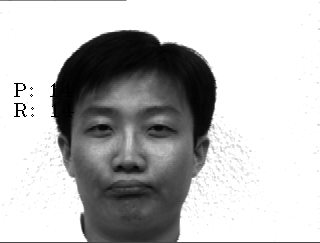

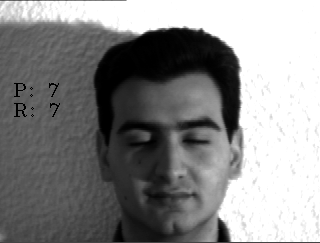

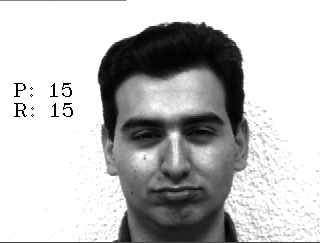

In [38]:
paths = [os.path.join("/content/drive/MyDrive/yalefaces/test", f) for f in os.listdir("/content/drive/MyDrive/yalefaces/test")]
for path in paths:
  img = Image.open(path).convert('L')
  image_np = np.array(img, 'uint8')
  predict_id, _ = recognizer.predict(image_np)
  correct_id = int(os.path.split(test_image)[1].split(".")[0].replace("subject", ""))
  cv2.putText(image_np, 'P: '+str(predict_id), (x,y + 30), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255,0))
  cv2.putText(image_np, 'R: '+str(predict_id), (x,y + 50), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255,0))
  cv2_imshow(image_np)
